loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Epoch [1/20]
    Training Loss: 1.0514
    Validation Loss: 0.7496
    Mean IoU: 0.5671, mAP: 0.0000, Accuracy: 0.6111
Epoch [2/20]
    Training Loss: 0.6464
    Validation Loss: 0.5556
    Mean IoU: 0.4511, mAP: 0.0212, Accuracy: 0.5833
Epoch [3/20]
    Training Loss: 0.5463
    Validation Loss: 0.4967
    Mean IoU: 0.5449, mAP: 0.0119, Accuracy: 0.8056
Epoch [4/20]
    Training Loss: 0.4582
    Validation Loss: 0.4656
    Mean IoU: 0.4504, mAP: 0.0093, Accuracy: 0.7500
Epoch [5/20]
    Training Loss: 0.4045
    Validation Loss: 0.4424
    Mean IoU: 0.5660, mAP: 0.0000, Accuracy: 0.7222
Epoch [6/20]
    Training Loss: 0.3811
    Validation Loss: 0.4169
    Mean IoU: 0.5781, mAP: 0.0093, Accuracy: 0.9167
Epoch [7/20]
    Training Loss: 0.328

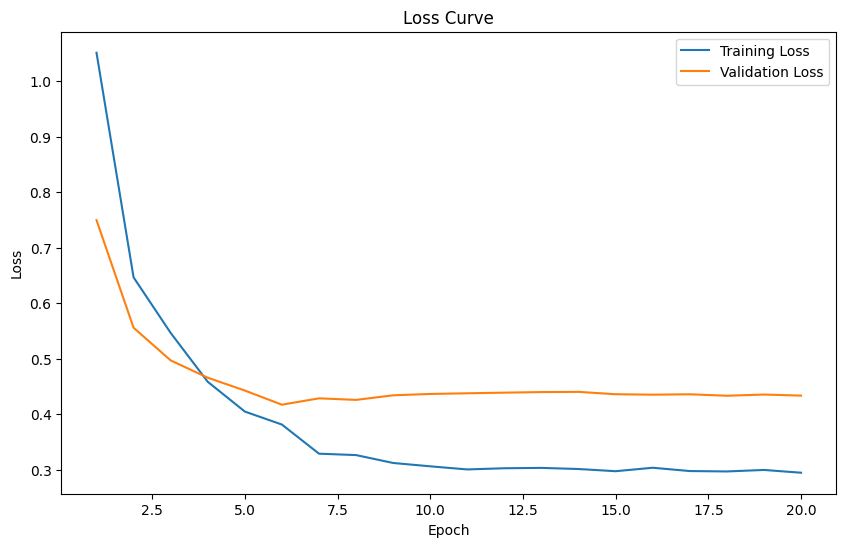

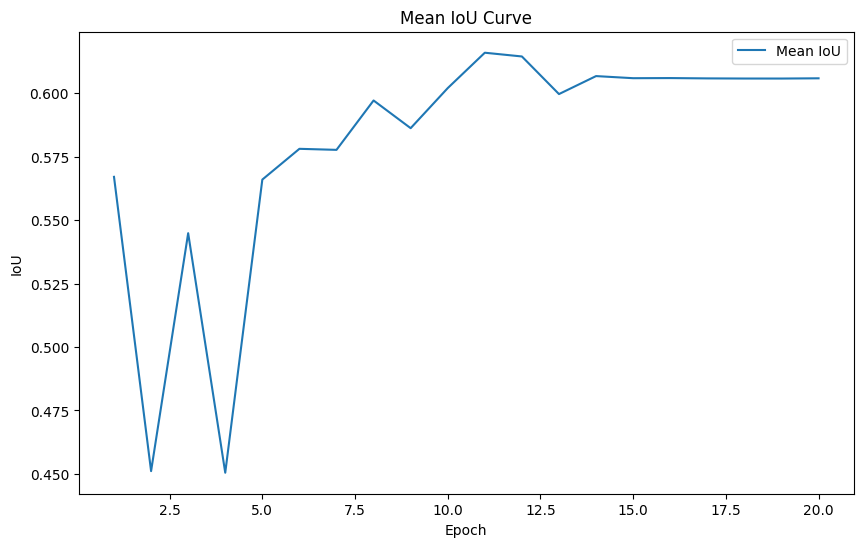

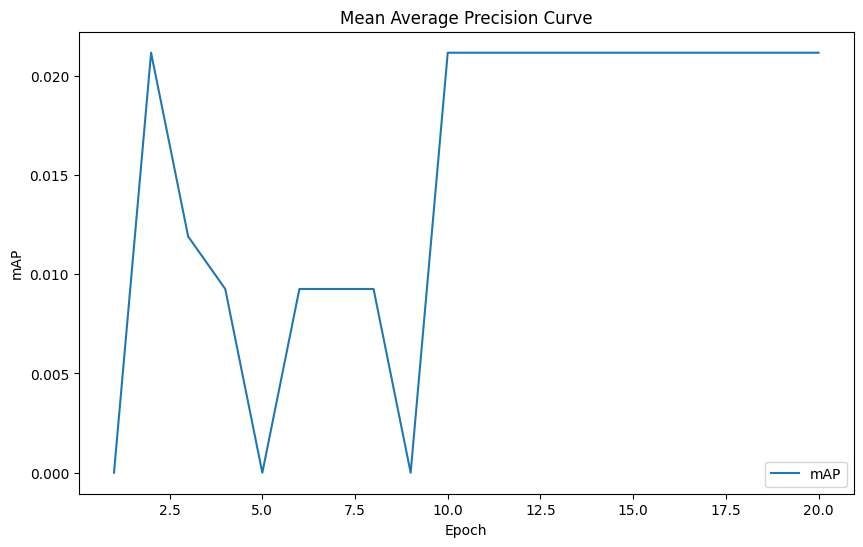

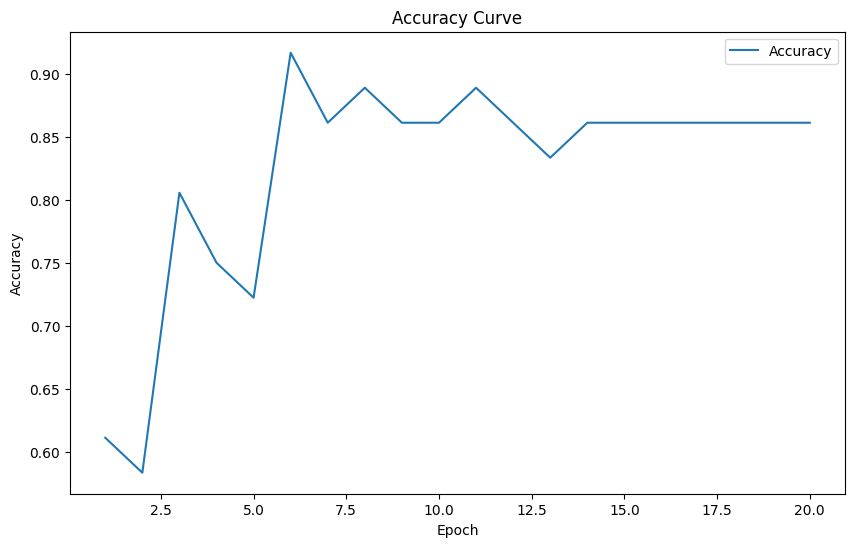

In [7]:
import json
import torch
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision import models
from PIL import Image
import numpy as np
from pycocotools.coco import COCO
import torchvision
import matplotlib.pyplot as plt

# Paths to directories and annotation files
train_image_dir = "/content/dataset/train"
val_image_dir = "/content/dataset/valid"
test_image_dir = "/content/dataset/test"
train_annotation_path = "/content/annotation/train_annotations.coco.json"
val_annotation_path = "/content/annotation/valid_annotations.coco.json"
test_annotation_path = "/content/annotation/test_annotations.coco.json"

# Hyperparameters
batch_size = 8
num_classes = 3  # 2 classes - trashcans and poles + 1 background class
learning_rate = 0.0001
num_epochs = 20

# Custom Dataset Class
class CustomCocoDataset(Dataset):
    def __init__(self, image_dir, annotation_path, transform=None):
        self.image_dir = image_dir
        self.coco = COCO(annotation_path)
        self.image_ids = list(self.coco.imgs.keys())
        self.transform = transform

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        ann_ids = self.coco.getAnnIds(imgIds=image_id)
        anns = self.coco.loadAnns(ann_ids)

        image_info = self.coco.loadImgs(image_id)[0]
        image_path = f"{self.image_dir}/{image_info['file_name']}"
        image = Image.open(image_path).convert("RGB")

        boxes, labels, masks = [], [], []
        for ann in anns:
            bbox = ann['bbox']
            xmin, ymin, width, height = bbox
            boxes.append([xmin, ymin, xmin + width, ymin + height])
            labels.append(ann['category_id'])
            mask = self.coco.annToMask(ann)
            mask = Image.fromarray(mask).resize((image_info['width'], image_info['height']), Image.NEAREST)
            masks.append(torch.as_tensor(np.array(mask), dtype=torch.uint8))

        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        labels = torch.as_tensor(labels, dtype=torch.int64)
        masks = torch.stack(masks, dim=0)

        target = {'boxes': boxes, 'labels': labels, 'masks': masks}
        if self.transform:
            image = self.transform(image)
        return image, target

# Data Transformations
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Custom collate function
def custom_collate_fn(batch):
    images = [item[0] for item in batch]
    targets = [{k: v for k, v in item[1].items()} for item in batch]
    return images, targets

# Create dataset instances
train_dataset = CustomCocoDataset(train_image_dir, train_annotation_path, transform=transform)
val_dataset = CustomCocoDataset(val_image_dir, val_annotation_path, transform=transform)
test_dataset = CustomCocoDataset(test_image_dir, test_annotation_path, transform=transform)

# DataLoaders
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, collate_fn=custom_collate_fn)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, collate_fn=custom_collate_fn)

# Load Mask R-CNN model
model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT")

# Adjust model for the dataset
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)
model.roi_heads.mask_predictor = torchvision.models.detection.mask_rcnn.MaskRCNNPredictor(256, num_classes, 28)

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Define optimizer and scheduler
params = [p for p in model.parameters() if p.requires_grad]
optimizer = optim.Adam(params, lr=learning_rate)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)

# IoU Calculation
def calculate_iou(mask1, mask2):
    intersection = np.logical_and(mask1, mask2)
    union = np.logical_or(mask1, mask2)
    if np.sum(union) == 0:
        return 0
    return np.sum(intersection) / np.sum(union)

# Metrics Calculation
def evaluate_metrics(loader, model, confidence_threshold=0.5, iou_threshold=0.5):
    model.eval()
    iou_scores = []
    aps = []
    correct_predictions = 0
    total_ground_truth = 0
    total_predictions = 0

    with torch.no_grad():
        for images, targets in loader:
            for image, target in zip(images, targets):
                # Forward pass
                output = model([image.to(device)])[0]

                # Ground Truth
                gt_masks = target["masks"].cpu().numpy()
                gt_boxes = target["boxes"].cpu().numpy()
                gt_labels = target["labels"].cpu().numpy()

                # Predictions
                pred_masks = output["masks"].cpu().numpy()
                pred_boxes = output["boxes"].cpu().numpy()
                pred_scores = output["scores"].cpu().numpy()
                pred_labels = output["labels"].cpu().numpy()

                # Filter predictions by confidence threshold
                indices = pred_scores > confidence_threshold
                pred_masks = pred_masks[indices]
                pred_boxes = pred_boxes[indices]
                pred_labels = pred_labels[indices]

                # IoU Calculation
                for pred_mask in pred_masks:
                    pred_mask = pred_mask[0] > 0.5
                    ious = [calculate_iou(pred_mask, gt_mask) for gt_mask in gt_masks]
                    if ious:
                        iou_scores.append(max(ious))

                # mAP Calculation
                tp, fp, matched = np.zeros(len(pred_boxes)), np.zeros(len(pred_boxes)), set()
                for j, pred_box in enumerate(pred_boxes):
                    ious = [calculate_iou(pred_box, gt_box) for gt_box in gt_boxes]
                    max_iou_idx = np.argmax(ious)
                    if ious[max_iou_idx] >= iou_threshold and max_iou_idx not in matched:
                        tp[j] = 1
                        matched.add(max_iou_idx)
                    else:
                        fp[j] = 1
                tp_cumsum = np.cumsum(tp)
                fp_cumsum = np.cumsum(fp)
                precision = tp_cumsum / (tp_cumsum + fp_cumsum + 1e-6)
                recall = tp_cumsum / len(gt_boxes)
                aps.append(np.trapz(precision, recall))

                # Accuracy Calculation
                total_ground_truth += len(gt_masks)
                for pred_mask, pred_label in zip(pred_masks, pred_labels):
                    pred_mask = pred_mask[0] > 0.5
                    best_iou = 0
                    for gt_mask, gt_label in zip(gt_masks, gt_labels):
                        if pred_label == gt_label:
                            iou = calculate_iou(pred_mask, gt_mask)
                            if iou > best_iou:
                                best_iou = iou
                    if best_iou >= iou_threshold:
                        correct_predictions += 1
                total_predictions += len(pred_masks)

    mean_iou = np.mean(iou_scores) if iou_scores else 0
    mean_ap = np.mean(aps) if aps else 0
    accuracy = correct_predictions / total_ground_truth if total_ground_truth > 0 else 0

    return mean_iou, mean_ap, accuracy

def train_model(model, train_loader, val_loader, optimizer, lr_scheduler, num_epochs):
    train_losses = []
    val_losses = []
    iou_scores = []
    map_scores = []
    accuracies = []

    for epoch in range(num_epochs):
        # ---- Training Phase ----
        model.train()
        total_train_loss = 0.0
        for images, targets in train_loader:
            images = [image.to(device) for image in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            # Forward pass and loss
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            # Backpropagation
            optimizer.zero_grad()
            losses.backward()
            optimizer.step()

            total_train_loss += losses.item()

        # ---- Validation Phase ----
        model.eval()
        total_val_loss = 0.0
        with torch.no_grad():
            for images, targets in val_loader:
                images = [image.to(device) for image in images]
                targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

                # Calculate validation loss
                model.train()
                loss_dict = model(images, targets)
                losses = sum(loss for loss in loss_dict.values())
                total_val_loss += losses.item()
                model.eval()

        # Adjust learning rate
        lr_scheduler.step()

        # Calculate metrics
        mean_iou, mean_ap, accuracy = evaluate_metrics(val_loader, model)
        iou_scores.append(mean_iou)
        map_scores.append(mean_ap)
        accuracies.append(accuracy)

        # Record losses
        avg_train_loss = total_train_loss / len(train_loader)
        avg_val_loss = total_val_loss / len(val_loader)
        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)

        # Print results
        print(f"Epoch [{epoch + 1}/{num_epochs}]")
        print(f"    Training Loss: {avg_train_loss:.4f}")
        print(f"    Validation Loss: {avg_val_loss:.4f}")
        print(f"    Mean IoU: {mean_iou:.4f}, mAP: {mean_ap:.4f}, Accuracy: {accuracy:.4f}")

    return train_losses, val_losses, iou_scores, map_scores, accuracies

# Visualization function
def visualize_predictions(loader, confidence_threshold=0.5):
    model.eval()
    with torch.no_grad():
        for images, targets in loader:
            for i, (image, target) in enumerate(zip(images, targets)):
                img = image.permute(1, 2, 0).cpu().numpy()
                img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
                img = np.clip(img, 0, 1)

                plt.figure(figsize=(12, 6))

                # Ground Truth
                plt.subplot(1, 2, 1)
                plt.imshow(img)
                for mask in target['masks']:
                    plt.imshow(np.ma.masked_where(mask.cpu().numpy() == 0, mask.cpu().numpy()), alpha=0.5, cmap='Reds')
                plt.title("Ground Truth Mask")

                # Predictions
                plt.subplot(1, 2, 2)
                plt.imshow(img)
                output = model([image.to(device)])[0]
                for j, pred_mask in enumerate(output['masks']):
                    score = output['scores'][j].item()
                    if score > confidence_threshold:
                        pred_mask = pred_mask[0].cpu().numpy()
                        plt.imshow(np.ma.masked_where(pred_mask < 0.5, pred_mask), alpha=0.5, cmap='Greens')
                plt.title(f"Predicted Mask (Confidence > {confidence_threshold})")

                plt.show()

# Train the model
train_losses, val_losses, iou_scores, map_scores, accuracies = train_model(
    model, train_loader, val_loader, optimizer, lr_scheduler, num_epochs
)

# Plot Metrics
epochs = range(1, num_epochs + 1)

# Loss Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, train_losses, label='Training Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Curve')
plt.legend()
plt.show()

# IoU Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, iou_scores, label='Mean IoU')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.title('Mean IoU Curve')
plt.legend()
plt.show()

# mAP Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, map_scores, label='mAP')
plt.xlabel('Epoch')
plt.ylabel('mAP')
plt.title('Mean Average Precision Curve')
plt.legend()
plt.show()

# Accuracy Plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, accuracies, label='Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy Curve')
plt.legend()
plt.show()


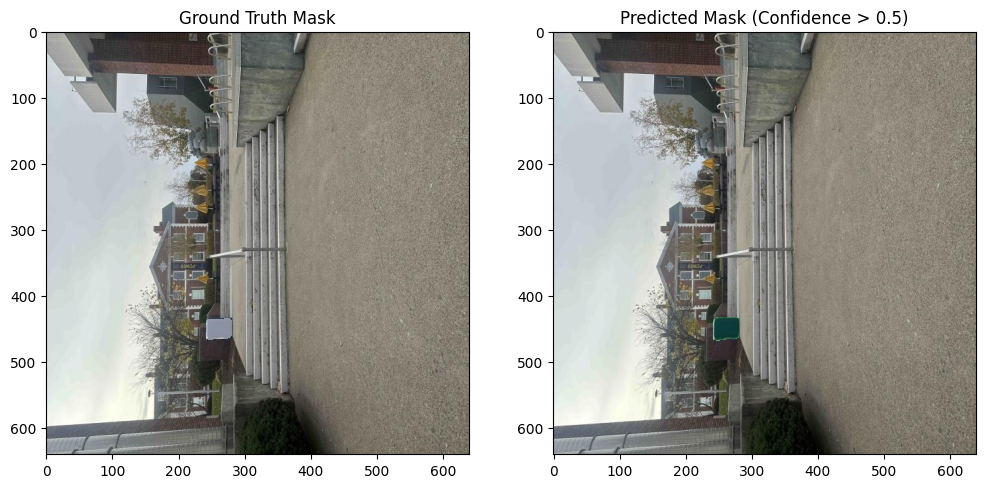

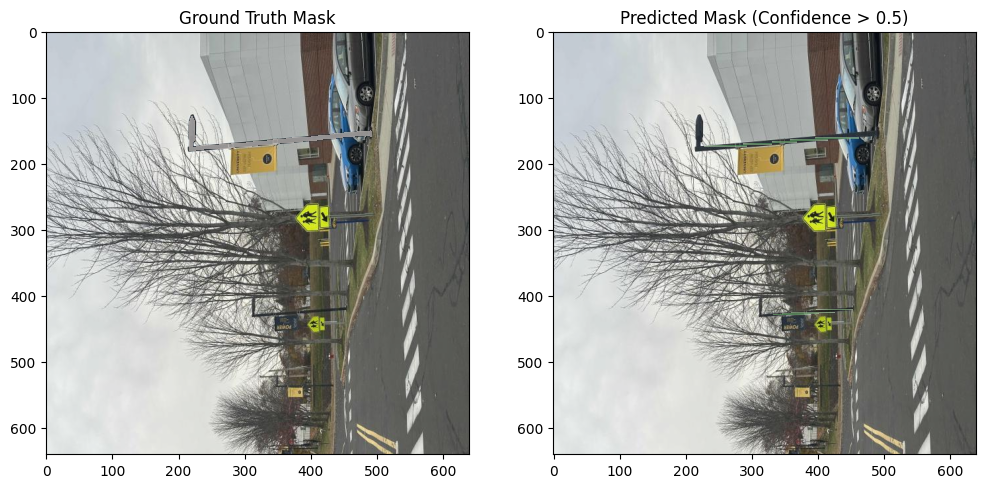

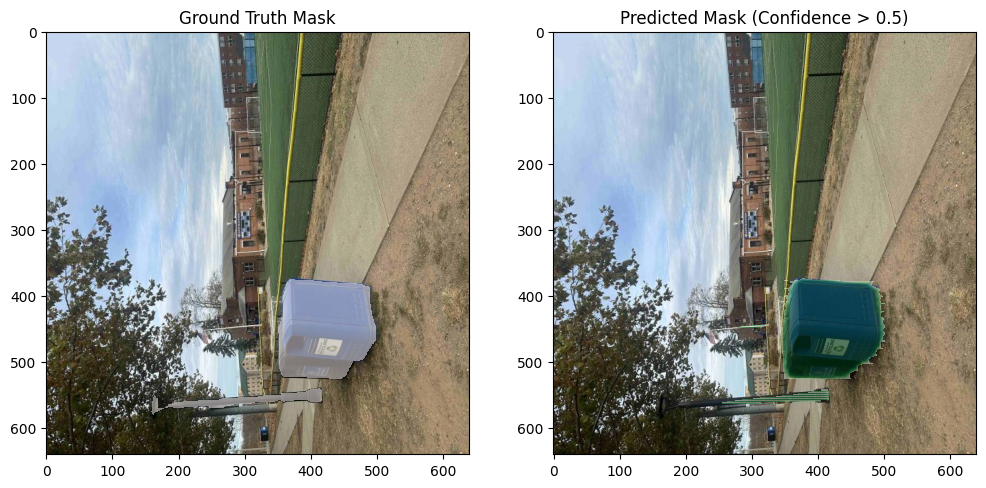

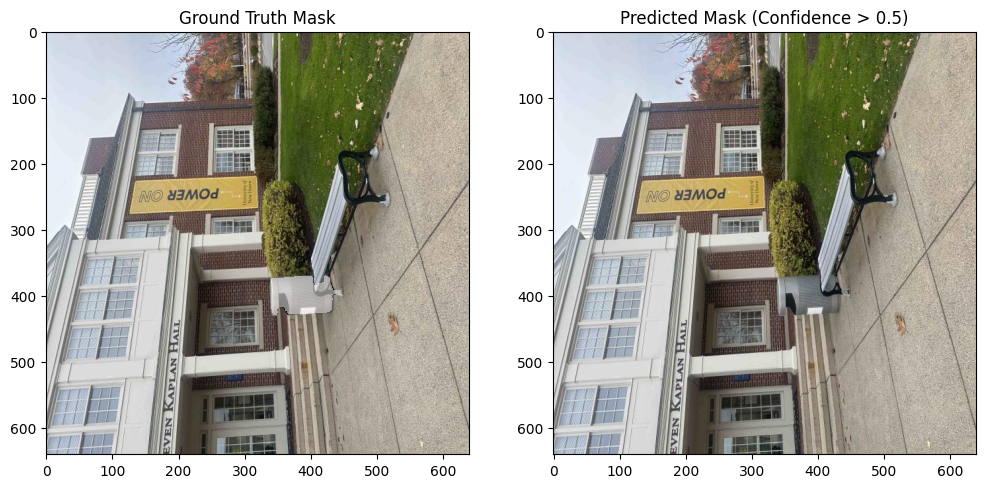

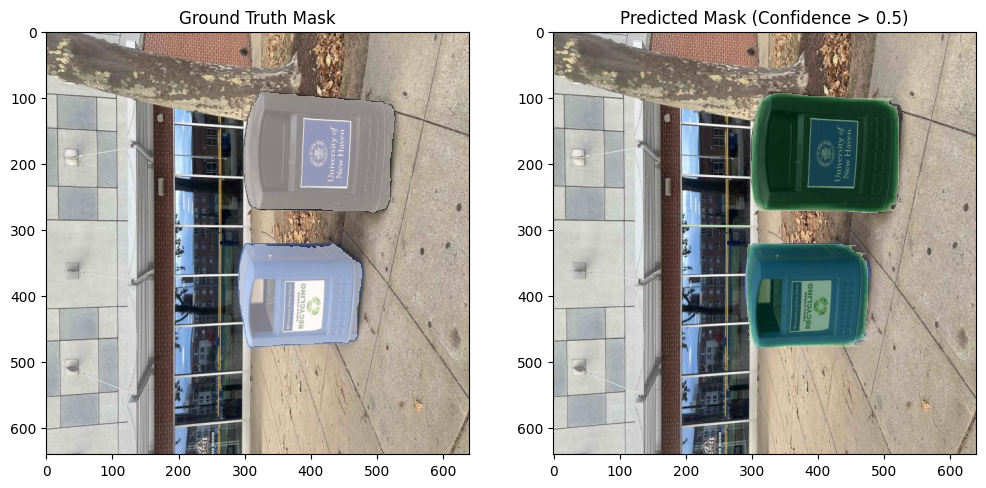

...

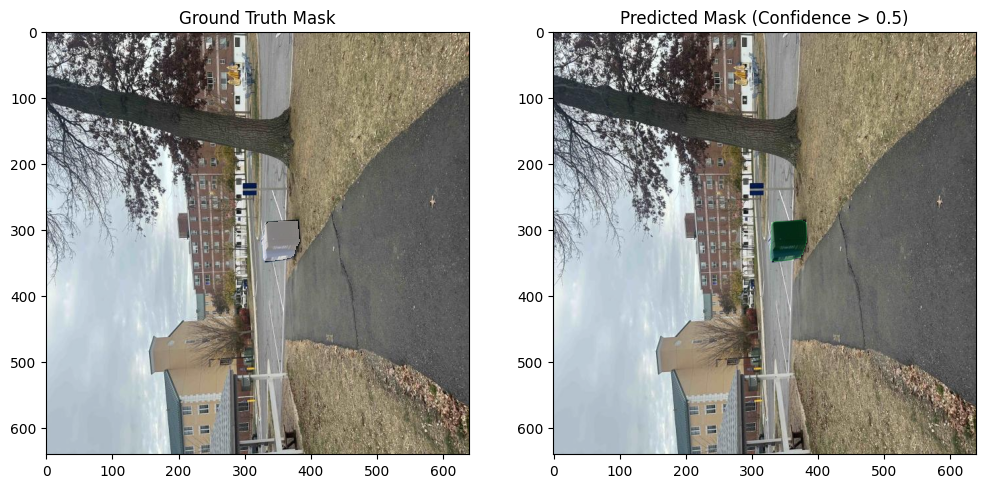

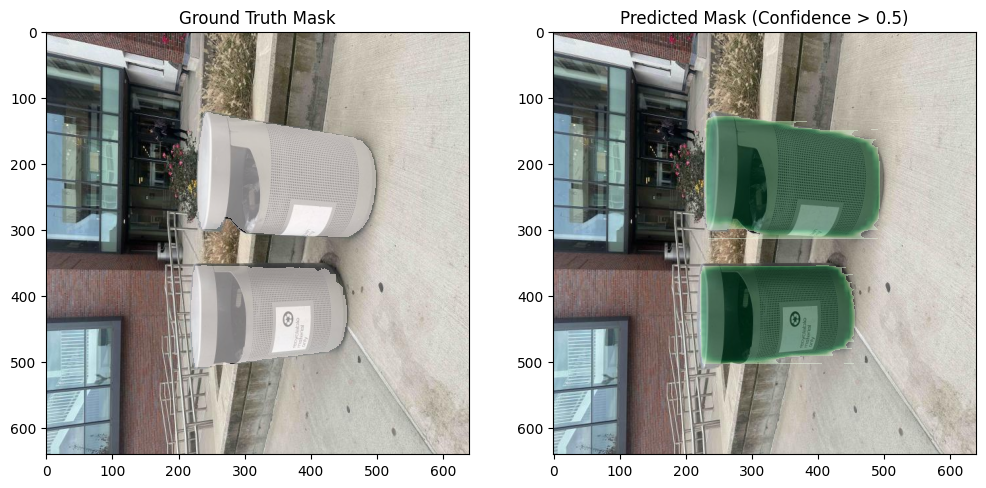

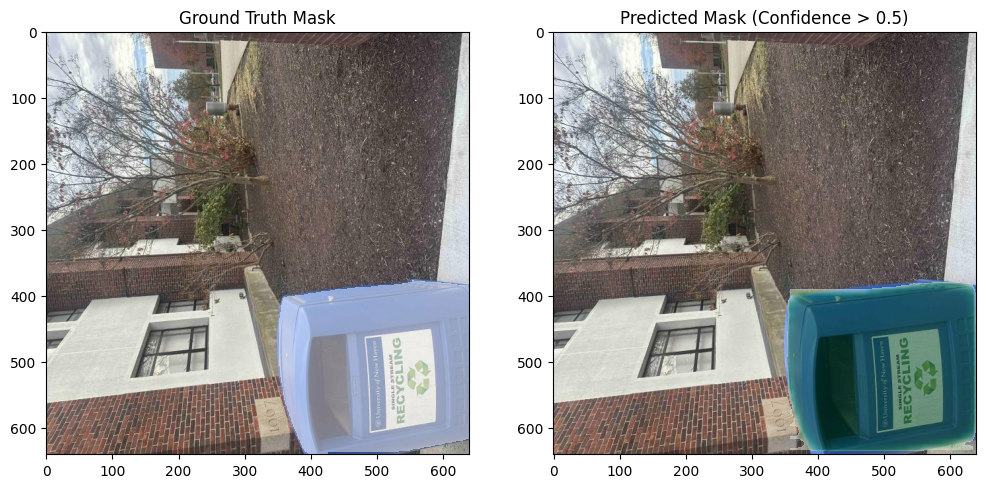

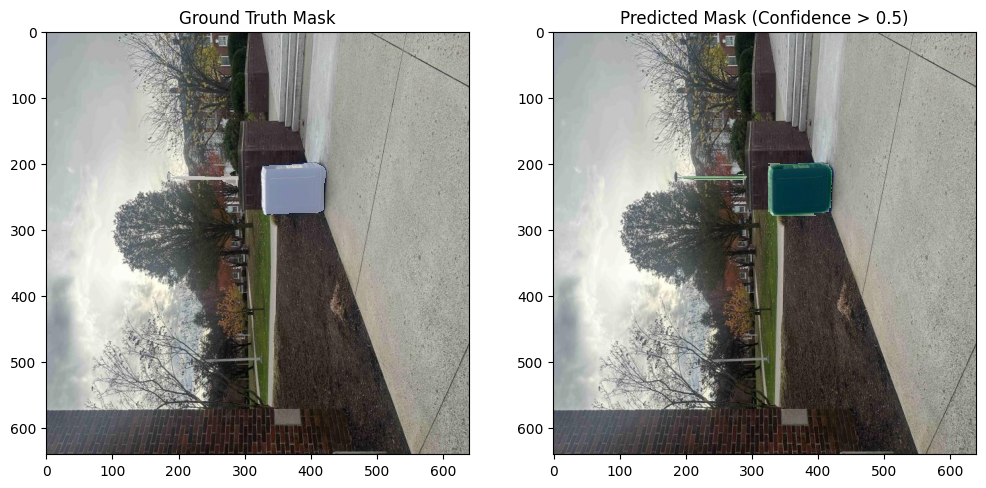

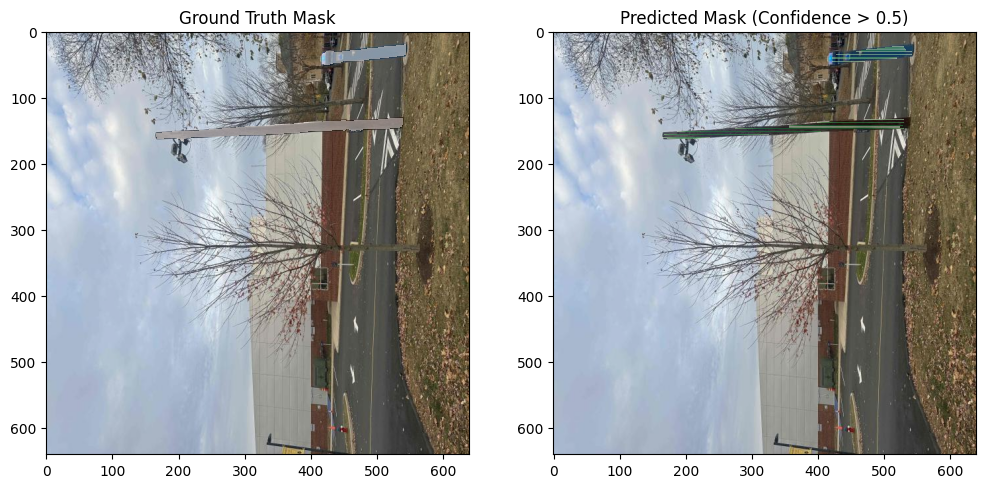

In [8]:
#visualize predictions
visualize_predictions(val_loader, confidence_threshold=0.5)